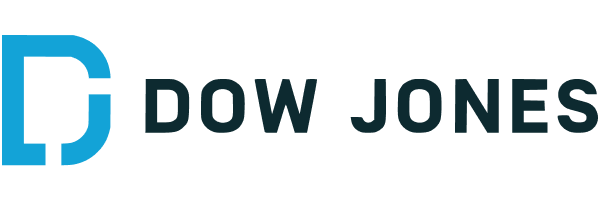

<center>

# **Network analysis: Dow Jones Industrial Average**


## Analiza mreža
#####  Mia Kalaica





DATASET SOURCE: https://hr.wikipedia.org/wiki/Dow_Jones



INTENTION: Once we have the cooked relationship data, using NetworkX we will perform network analysis. For the analysis we will use centrality measurement tools like degree centrality, closeness centrality, betweenness centrality, pagerank and etc... in our network.


HYPOTHESIS: "Is there a connection between specific stocks or funds and their importance, influence, and growth potential in the market?"

Install the required packages.

Import necessary libraries.

Mount Google Drive and load the CSV data into a DataFrame.

Create a networkx Graph object.
Create a dictionary to store project-organization relationships.

Add edges between organizations involved in the same project.

Perform basic network analysis: graph size, edge density, degree distribution, and connected components.

Create a random subgraph for further analysis.

Visualize the subgraph.

Calculate clustering coefficient, centrality measures, and community detection.

Analyze communities and identify important nodes.

Extract and print names of top nodes based on degree centrality.

Calculate and print the diameter of the graph and the largest connected component.

Calculate the number of triangles in the graph, which indicates cohesive collaboration patterns.

####1.Install the required libraries

In [ ]:
import numpy as np
import pandas as pd
import networkx as nx
from networkx.algorithms import community
from networkx.algorithms.community.quality import modularity
import matplotlib.pyplot as plt
import random
import plotly
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
import itertools
from collections import Counter
import seaborn as sns
import statsmodels.api as sm
import yfinance as yf
init_notebook_mode(connected=True)

In [ ]:
pip install --upgrade networkx

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pip install --upgrade matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install pyvis

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 25.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 82.7 MB/s eta 0:00:00


####2. Getting Dataframe



In [ ]:
tickers = pd.read_html('https://en.wikipedia.org/wiki/Dow_Jones_Industrial_Average')[1] #tablica u wikipediji koja sadrži tickere

In [ ]:
tickers

,Company,Exchange,Symbol,Industry,Date added,Notes,Index weighting
0,3M,NYSE,MMM,Conglomerate,1976-08-09,As Minnesota Mining and Manufacturing,2.41%
1,American Express,NYSE,AXP,Financial services,1982-08-30,NaN,3.02%
2,Amgen,NASDAQ,AMGN,Biopharmaceutical,2020-08-31,NaN,5.48%
3,Apple,NASDAQ,AAPL,Information technology,2015-03-19,NaN,2.84%
4,Boeing,NYSE,BA,Aerospace and defense,1987-03-12,NaN,3.36%
5,Caterpillar,NYSE,CAT,Construction and Mining,1991-05-06,NaN,4.52%
6,Chevron,NYSE,CVX,Petroleum industry,2008-02-19,Also 1930-07-18 to 1999-11-01,3.50%
7,Cisco,NASDAQ,CSCO,Information technology,2009-06-08,NaN,0.96%
8,Coca-Cola,NYSE,KO,Drink industry,1987-03-12,Also 1932-05-26 to 1935-11-20,1.22%
9,Disney,NYSE,DIS,Broadcasting and entertainment,1991-05-06,NaN,1.89%


In [ ]:
tickers = tickers.Symbol.to_list()

In [ ]:
tickers

['MMM',
 'AXP',
 'AMGN',
 'AAPL',
 'BA',
 'CAT',
 'CVX',
 'CSCO',
 'KO',
 'DIS',
 'DOW',
 'GS',
 'HD',
 'HON',
 'IBM',
 'INTC',
 'JNJ',
 'JPM',
 'MCD',
 'MRK',
 'MSFT',
 'NKE',
 'PG',
 'CRM',
 'TRV',
 'UNH',
 'VZ',
 'V',
 'WBA',
 'WMT']

In [ ]:
frames_mtf = []  #kreiranje liste

for ticker in tickers:
    var = yf.Ticker(ticker)
    frame = var.mutualfund_holders
    if frame is not None:
        frame['comp'] = var.ticker
        frames_mtf.append(frame.copy())

In [ ]:
frames_inst = []  #kreiranje liste

for ticker in tickers:
    var = yf.Ticker(ticker)
    frame = var.institutional_holders
    frame['comp'] = var.ticker
    frames_inst.append(frame.copy())

In [ ]:
df1 = pd.concat(frames_mtf)
df2 = pd.concat(frames_inst)
df = pd.concat([df1, df2])
df

,Holder,Shares,Date Reported,% Out,Value,comp
0,Vanguard Total Stock Market Index Fund,17022976,2022-12-30,0.0309,1588413849,MMM
1,Vanguard 500 Index Fund,12777937,2022-12-30,0.0232,1192309270,MMM
2,Schwab Strategic Tr-Schwab U.S. Dividend Equit...,9213146,2023-02-27,0.0167,859678630,MMM
3,Fidelity 500 Index Fund,6059476,2023-02-27,0.0110,565409690,MMM
4,SPDR S&P 500 ETF Trust,5974775,2023-03-30,0.0108,557506240,MMM
...,...,...,...,...,...,...
5,Bank of America Corporation,21877588,2023-03-30,0.0081,3213161242,WMT
6,Norges Bank Investment Management,18328064,2022-12-30,0.0068,2691842670,WMT
7,Price (T.Rowe) Associates Inc,16456490,2023-03-30,0.0061,2416964605,WMT
8,Northern Trust Corporation,14794264,2023-03-30,0.0055,2172833481,WMT


In [ ]:
df.shape

(590, 6)

In [ ]:
dataf = df
unique_holders = dataf['Holder'].unique()
unique_companies = dataf['comp'].unique()
print("Unique Holders:", unique_holders)
print("Unique Companies:", unique_companies)

Unique Holders: ['Vanguard Total Stock Market Index Fund' 'Vanguard 500 Index Fund'
 'Schwab Strategic Tr-Schwab U.S. Dividend Equity ETF'
 'Fidelity 500 Index Fund' 'SPDR S&P 500 ETF Trust'
 'SPDR Dow Jones Industrial Average ETF' 'iShares Core S&P 500 ETF'
 'Vanguard Index-Value Index Fund'
 'Vanguard Institutional Index Fund-Institutional Index Fund'
 'SPDR (R) Ser Tr- SPDR (R) S&P (R) Dividend ETF'
 'Vanguard Specialized-Dividend Growth Fund'
 'MFS Series Trust I-MFS Value Fund' 'Select Sector SPDR Fund-Financial'
 'Vanguard/Primecap Fund' 'Invesco ETF Tr-Invesco QQQ Tr, Series 1 ETF'
 'Capital Income Builder, Inc.' 'Vanguard Growth Index Fund'
 'Vanguard Information Technology Index Fund'
 'Select Sector SPDR Fund-Technology' 'Growth Fund Of America Inc'
 'Investment Company Of America' 'Washington Mutual Investors Fund'
 'Select Sector SPDR Fund-Energy Select' 'Vanguard Energy Index Fund'
 'Vanguard Whitehall Funds-High Dividend Yield Index Fund'
 'Dodge & Cox Stock Fund' 'Select

In [ ]:
print(df.columns)

Index(['Holder', 'Shares', 'Date Reported', '% Out', 'Value', 'comp'], dtype='object')


In [ ]:
null_values= df.isnull()
print(null_values)

    Holder  Shares  Date Reported  % Out  Value   comp
0    False   False          False  False  False  False
1    False   False          False  False  False  False
2    False   False          False  False  False  False
3    False   False          False  False  False  False
4    False   False          False  False  False  False
..     ...     ...            ...    ...    ...    ...
5    False   False          False  False  False  False
6    False   False          False  False  False  False
7    False   False          False  False  False  False
8    False   False          False  False  False  False
9    False   False          False  False  False  False

[590 rows x 6 columns]


#### Distribution of Shares by Holder

In [ ]:
df_sorted = df.sort_values(by='Shares', ascending=False)

# Group the DataFrame by 'Holder' and calculate the total shares held by each holder
grouped = df.groupby('Holder')['Shares'].sum()

# Print the sorted DataFrame and grouped data
print("Sorted DataFrame:")
print(df_sorted)
print("\nTotal Shares Held by Each Holder:")
print(grouped)

Sorted DataFrame:
                             Holder      Shares Date Reported   % Out  \
0        Vanguard Group, Inc. (The)  1309785362    2023-03-30  0.0833   
1                    Blackrock Inc.  1035008939    2023-03-30  0.0658   
2           Berkshire Hathaway, Inc   915560382    2023-03-30  0.0582   
0        Vanguard Group, Inc. (The)   649516597    2023-03-30  0.0874   
3          State Street Corporation   576281774    2023-03-30  0.0366   
..                              ...         ...           ...     ...   
6           Fidelity 500 Index Fund     2569053    2023-02-27  0.0111   
7            SPDR S&P 500 ETF Trust     2502071    2023-03-30  0.0108   
9        Income Fund of America Inc     2298200    2023-03-30  0.0069   
8          iShares Core S&P 500 ETF     2091604    2023-02-27  0.0091   
9   Vanguard Index-Value Index Fund     2026402    2022-12-30  0.0088   

           Value  comp  
0   232159455414  AAPL  
1   183455334437  AAPL  
2   162283077709  AAPL  
0   2

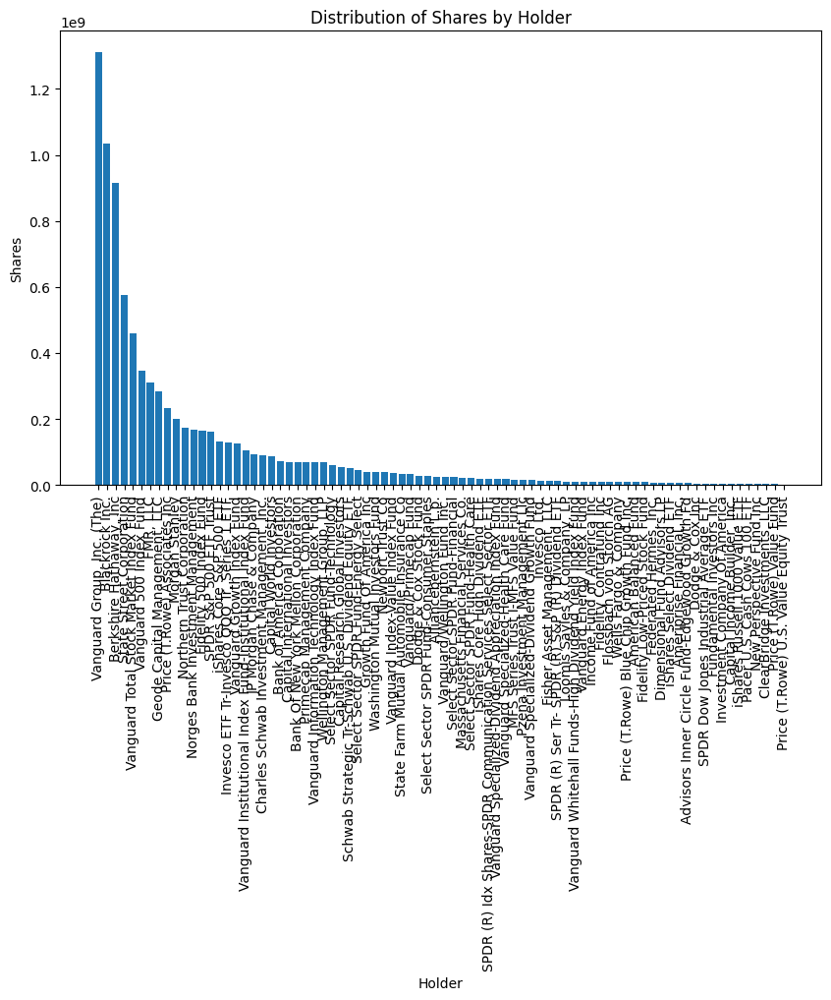

In [ ]:
import matplotlib.pyplot as plt

# Bar plot
plt.figure(figsize=(10, 6))
plt.bar(df_sorted['Holder'], df_sorted['Shares'])
plt.xticks(rotation=90)
plt.xlabel('Holder')
plt.ylabel('Shares')
plt.title('Distribution of Shares by Holder')
plt.show()



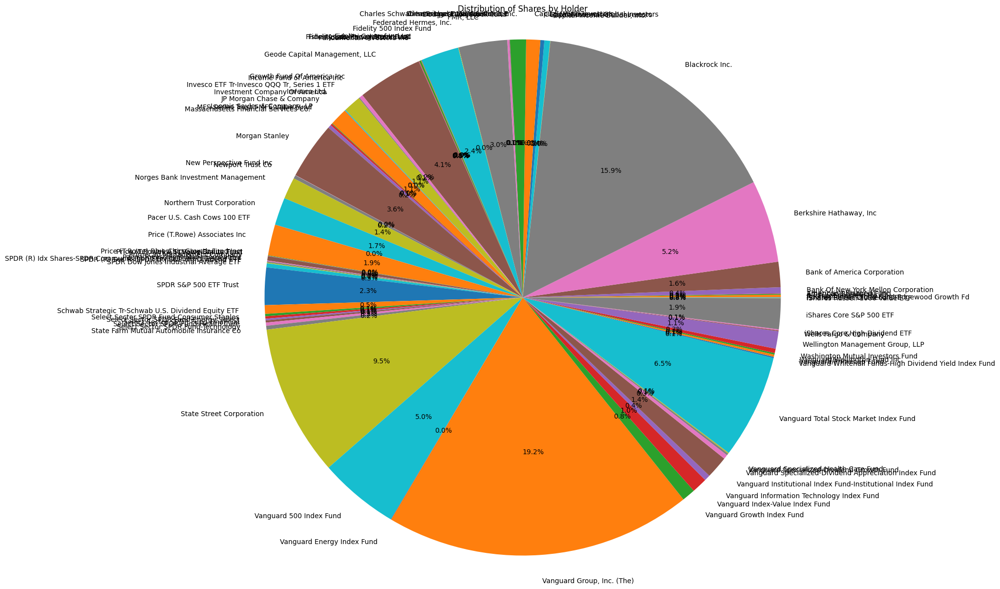

In [ ]:
# Pie chart
plt.figure(figsize=(15, 15))
plt.pie(grouped, labels=grouped.index, autopct='%1.1f%%')
plt.axis('equal')
plt.title('Distribution of Shares by Holder')
plt.show()


####Graphs

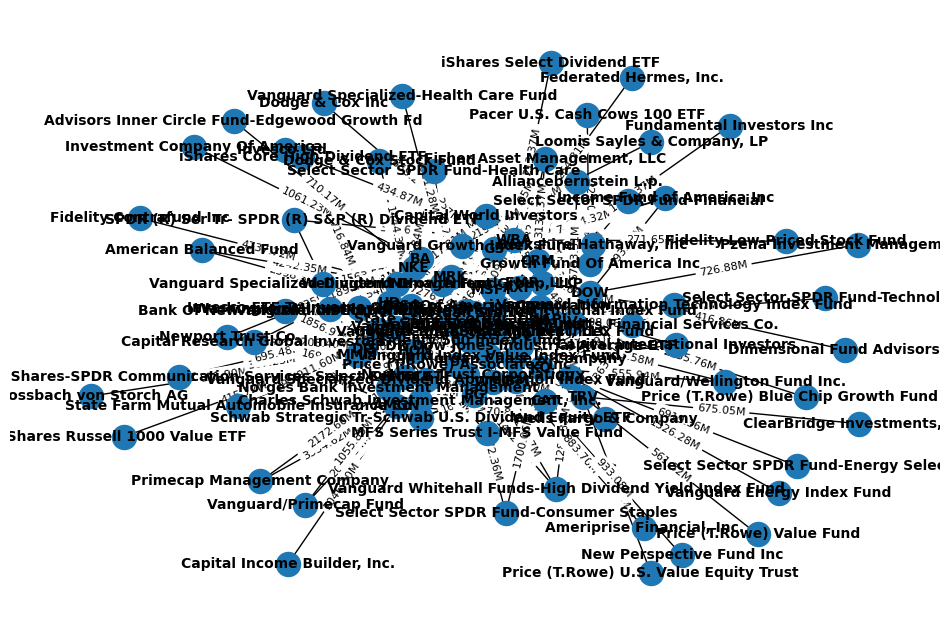

In [ ]:
# convert Values in smaller number of digits (million)
df['Value'] = df['Value'] / 1000000

# create networkx graph
G = nx.from_pandas_edgelist(df, 'Holder', 'comp', edge_attr='Value')

# draw graph and labels
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, k=0.15, iterations=20)
nx.draw_networkx(G, pos=pos, with_labels=True, node_size=300, font_size=10, font_weight='bold')
labels = nx.get_edge_attributes(G, 'Value')
formatted_labels = {k: f"{v:.2f}M" for k, v in labels.items()}
nx.draw_networkx_edge_labels(G, pos=pos, edge_labels=formatted_labels, font_size=8, font_weight='normal')
plt.axis('off')
plt.show()

# write graph to GEXF format
nx.write_gexf(G, 'graph.gexf')

#####Different visualization styles

In [ ]:
G1 = nx.from_pandas_edgelist(df, 'Holder', 'comp', edge_attr='Value')

colors =[]
for node in G1:
  if node in df['comp'].values:
    colors.append("red")#companies

  else:
    colors.append("yellow")  #holderi



In [ ]:
G1.degree()#number of relationships, broj veza(bridova) koji ovaj edge ima s drugim edgevima

DegreeView({'Vanguard Total Stock Market Index Fund': 30, 'MMM': 20, 'Vanguard 500 Index Fund': 30, 'Schwab Strategic Tr-Schwab U.S. Dividend Equity ETF': 7, 'Fidelity 500 Index Fund': 30, 'SPDR S&P 500 ETF Trust': 30, 'SPDR Dow Jones Industrial Average ETF': 14, 'iShares Core S&P 500 ETF': 30, 'Vanguard Index-Value Index Fund': 19, 'Vanguard Institutional Index Fund-Institutional Index Fund': 21, 'SPDR (R) Ser Tr- SPDR (R) S&P (R) Dividend ETF': 2, 'AXP': 20, 'Vanguard Specialized-Dividend Growth Fund': 4, 'MFS Series Trust I-MFS Value Fund': 4, 'Select Sector SPDR Fund-Financial': 3, 'AMGN': 20, 'Vanguard/Primecap Fund': 2, 'Invesco ETF Tr-Invesco QQQ Tr, Series 1 ETF': 7, 'Capital Income Builder, Inc.': 1, 'AAPL': 20, 'Vanguard Growth Index Fund': 9, 'Vanguard Information Technology Index Fund': 4, 'Select Sector SPDR Fund-Technology': 1, 'BA': 20, 'Growth Fund Of America Inc': 5, 'Investment Company Of America': 1, 'Washington Mutual Investors Fund': 6, 'CVX': 20, 'Select Sector SP

In [ ]:
dict(G1.degree())

{'Vanguard Total Stock Market Index Fund': 30,
 'MMM': 20,
 'Vanguard 500 Index Fund': 30,
 'Schwab Strategic Tr-Schwab U.S. Dividend Equity ETF': 7,
 'Fidelity 500 Index Fund': 30,
 'SPDR S&P 500 ETF Trust': 30,
 'SPDR Dow Jones Industrial Average ETF': 14,
 'iShares Core S&P 500 ETF': 30,
 'Vanguard Index-Value Index Fund': 19,
 'Vanguard Institutional Index Fund-Institutional Index Fund': 21,
 'SPDR (R) Ser Tr- SPDR (R) S&P (R) Dividend ETF': 2,
 'AXP': 20,
 'Vanguard Specialized-Dividend Growth Fund': 4,
 'MFS Series Trust I-MFS Value Fund': 4,
 'Select Sector SPDR Fund-Financial': 3,
 'AMGN': 20,
 'Vanguard/Primecap Fund': 2,
 'Invesco ETF Tr-Invesco QQQ Tr, Series 1 ETF': 7,
 'Capital Income Builder, Inc.': 1,
 'AAPL': 20,
 'Vanguard Growth Index Fund': 9,
 'Vanguard Information Technology Index Fund': 4,
 'Select Sector SPDR Fund-Technology': 1,
 'BA': 20,
 'Growth Fund Of America Inc': 5,
 'Investment Company Of America': 1,
 'Washington Mutual Investors Fund': 6,
 'CVX': 20,
 

In [ ]:
[v *  100 for v in dict(G1.degree()).values()]

[3000,
 2000,
 3000,
 700,
 3000,
 3000,
 1400,
 3000,
 1900,
 2100,
 200,
 2000,
 400,
 400,
 300,
 2000,
 200,
 700,
 100,
 2000,
 900,
 400,
 100,
 2000,
 500,
 100,
 600,
 2000,
 100,
 100,
 300,
 2000,
 200,
 2000,
 200,
 200,
 2000,
 100,
 200,
 2000,
 300,
 100,
 2000,
 2000,
 200,
 700,
 2000,
 2000,
 2000,
 2000,
 200,
 2000,
 2000,
 2000,
 100,
 2000,
 2000,
 100,
 2000,
 2000,
 100,
 2000,
 100,
 100,
 2000,
 100,
 2000,
 100,
 2000,
 100,
 2000,
 100,
 100,
 2000,
 2900,
 2900,
 2900,
 800,
 2800,
 2700,
 300,
 100,
 300,
 1700,
 400,
 1100,
 1200,
 300,
 1700,
 500,
 200,
 300,
 200,
 1400,
 1000,
 800,
 900,
 100,
 1000,
 100,
 400,
 100,
 100,
 100,
 100,
 200,
 200,
 100,
 100,
 100]

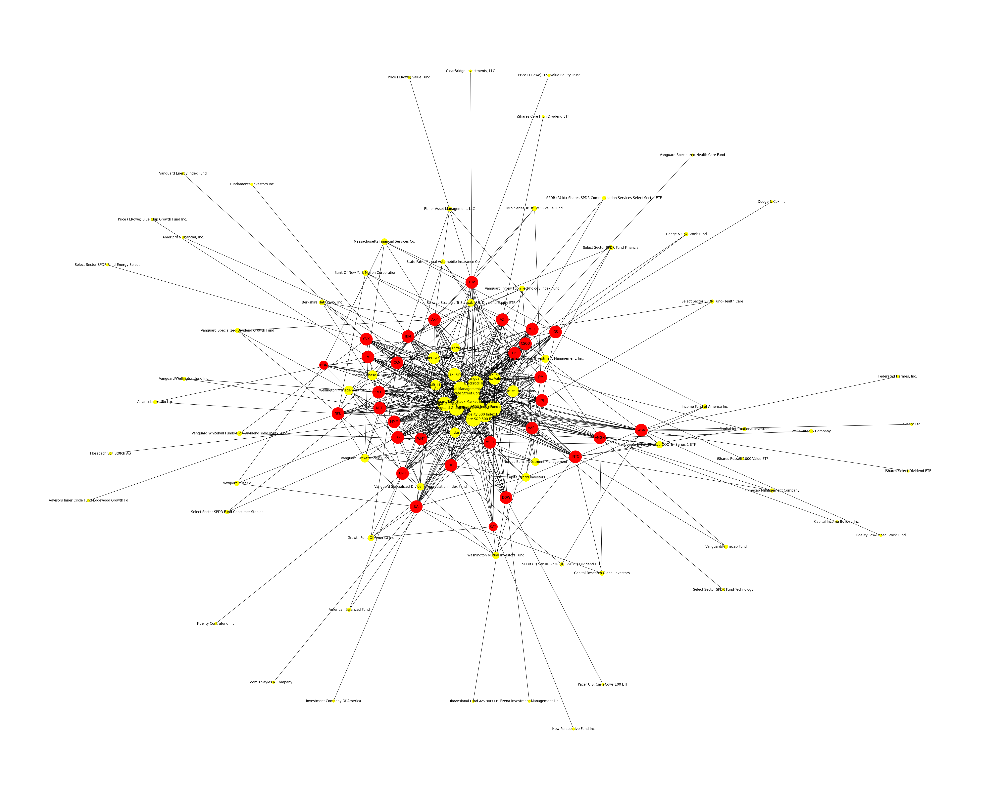

In [ ]:
plt.figure(figsize=(50,40))
nx.draw(G1, with_labels=True,
        node_color=colors,
        node_size= [v *  100 for v in dict(G1.degree()).values()])  #vece tockice (holderi)imaju vise udjela u dionicama

In [ ]:
G2 = nx.from_pandas_edgelist(df, 'Holder', 'comp', edge_attr='Value')

colors =[]
for node in G2:
  if node in df['comp'].values:
    colors.append("red")#companies

  else:
    colors.append("yellow")  #holderi



In [ ]:
edgelist = nx.to_edgelist(G2)

In [ ]:
[v[2]['Value']/50_000 for v  in edgelist]

[0.03177849034,
 0.05401758572,
 0.0715719649,
 1.62852757082,
 0.07454826682,
 0.15932702612,
 0.11166055096000001,
 0.14124850512,
 0.09752176602,
 0.020866383000000002,
 0.0611730228,
 0.17565030722,
 0.07070443116,
 0.07888751384,
 0.24664785058000002,
 0.24204736442000002,
 0.1269632107,
 0.1702446078,
 1.4882280934,
 0.08067648942,
 0.20547778313999998,
 0.12949797652,
 0.024078524379999997,
 0.27668714368,
 0.08648364600000001,
 0.21781359,
 0.012750140859999998,
 0.12118558912,
 0.06507224332,
 0.023853851840000002,
 0.01719910026,
 0.01131182934,
 0.01115370952,
 0.01044736656,
 0.00920960728,
 0.008920288759999999,
 0.00723140046,
 0.0066746946,
 0.09022109822,
 0.07478563478,
 0.06182002976,
 0.02340002344,
 0.02142113898,
 0.018924057,
 0.017841193579999998,
 0.01744354838,
 0.016397561720000002,
 0.013651023,
 0.04382327828,
 0.05443355474,
 1.22545804338,
 0.05328457434,
 0.12385818479999999,
 0.09429211488000001,
 0.10742868514,
 0.07416495484,
 0.01587199696,
 0.0465064

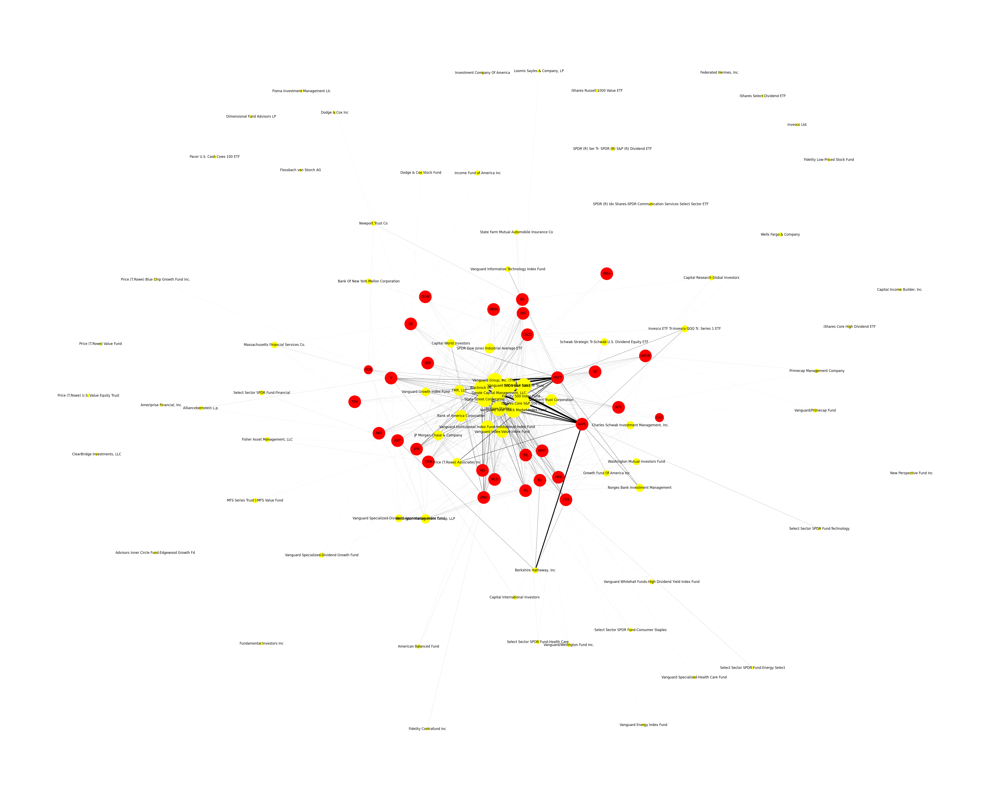

In [ ]:
plt.figure(figsize=(50, 40))
nx.draw(G2, with_labels=True,
        node_color=colors,
        node_size=[v * 100 for v in dict(G1.degree()).values()],  # Missing closing bracket here
        width=[v[2]['Value'] / 50000 for v in G2.edges(data=True)])


#####Different visualization styles


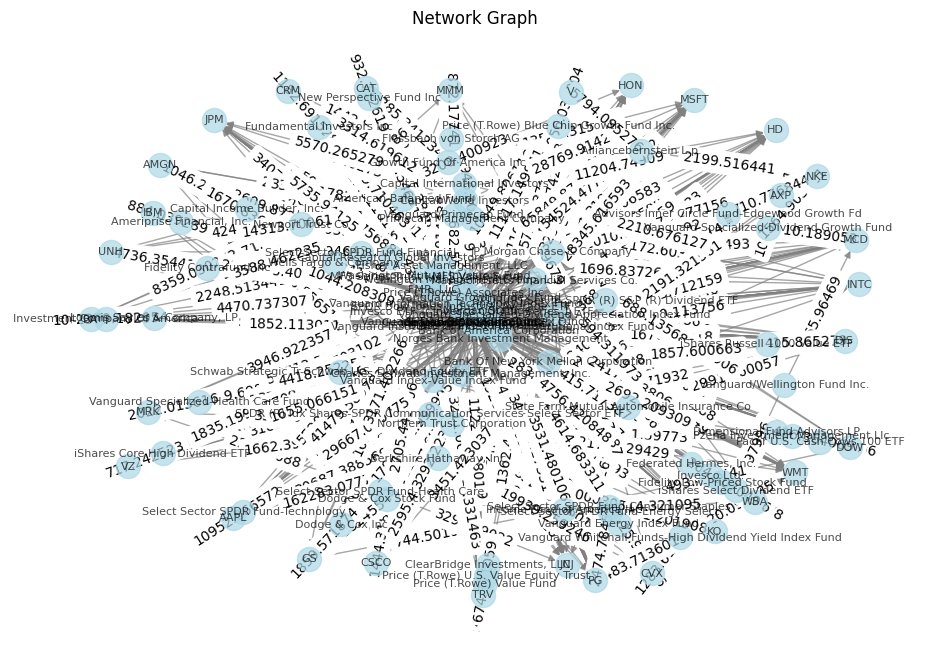

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Stvaranje praznog usmjerenog grafa
G = nx.DiGraph()

# Dodavanje čvorova (holderi i comp)
G.add_nodes_from(df['Holder'])
G.add_nodes_from(df['comp'])

# Dodavanje bridova (holderi -> comp) s težinama (value)
for index, row in df.iterrows():
    holder = row['Holder']
    comp = row['comp']
    value = row['Value']
    G.add_edge(holder, comp, weight=value)

# Vizualizacija grafa mreže
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, seed=42)
nx.draw_networkx(G, pos, with_labels=True, node_color='lightblue', edge_color='gray', alpha=0.7, font_size=8)
edge_labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
plt.title('Network Graph')
plt.axis('off')
plt.show()


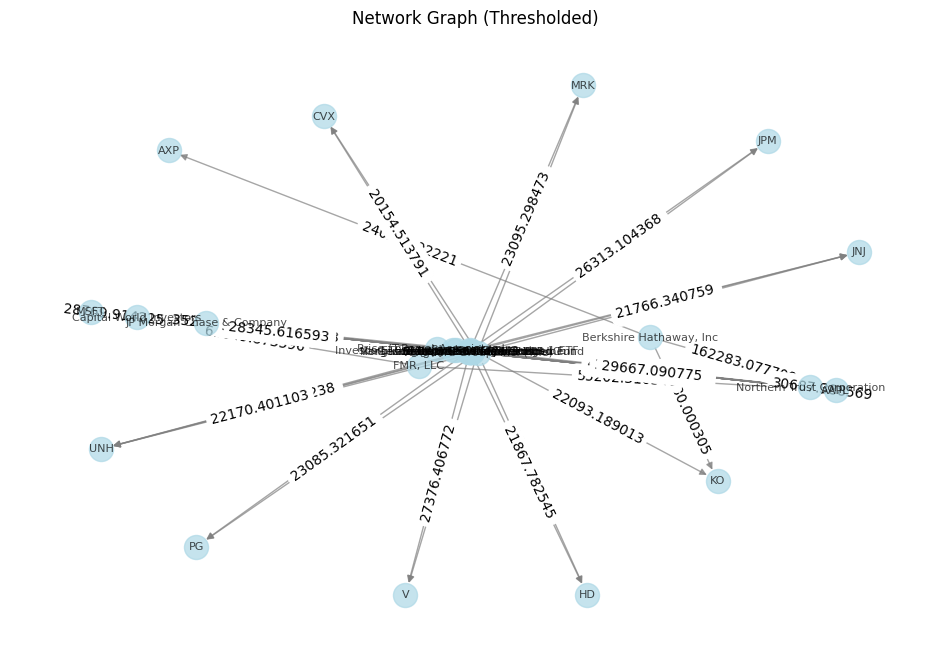

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Postavite prag vrijednosti bridova
threshold = 20000  # Prag vrijednosti (primjer)

# Filtrirajte podatke prema vrijednosti
filtered_df = df[df['Value'] > threshold]

# Stvaranje praznog usmjerenog grafa
G = nx.DiGraph()

# Dodavanje čvorova (holderi i comp)
G.add_nodes_from(filtered_df['Holder'])
G.add_nodes_from(filtered_df['comp'])

# Dodavanje bridova (holderi -> comp) s težinama (value)
for index, row in filtered_df.iterrows():
    holder = row['Holder']
    comp = row['comp']
    value = row['Value']
    G.add_edge(holder, comp, weight=value)

# Vizualizacija grafa mreže
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, seed=42)
nx.draw_networkx(G, pos, with_labels=True, node_color='lightblue', edge_color='gray', alpha=0.7, font_size=8)
edge_labels = nx.get_edge_attributes(G, 'weight')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
plt.title('Network Graph (Thresholded)')
plt.axis('off')
plt.show()


U ovom primjeru postavili smo prag vrijednosti (threshold) na 20.000 (primjer), što znači da ćemo prikazati samo bridove čija je vrijednost veća od tog praga. Filtrirali smo DataFrame (df) koristeći taj prag i stvorili novi DataFrame (filtered_df) koji sadrži samo relevantne podatke.

Zatim smo izgradili graf mreže samo na temelju filtriranih podataka. Dodali smo čvorove i bridove u graf, koristeći vrijednosti iz DataFrame-a filtered_df. Na kraju smo vizualizirali graf mreže s prikazom samo relevantnih bridova iznad zadane vrijednosti praga.

Promijenite prag vrijednosti prema svojim potrebama kako biste prikazali samo one bridove koji su vam bitni i imaju veću vrijednost. Ovim pristupom možete smanjiti broj prikazanih bridova i postići pregledniji prikaz mreže

In [ ]:
# Create a new bipartite graph
G = nx.Graph()

# Add the Holder and comp nodes to the graph
holders = set(df['Holder'])
companies = set(df['comp'])
G.add_nodes_from(holders, bipartite=0)
G.add_nodes_from(companies, bipartite=1)

# Add the edges between the Holder and comp nodes
for i, row in df.iterrows():
    holder = row['Holder']
    company = row['comp']
    shares = row['Shares']
    G.add_edge(holder, company, weight=shares)



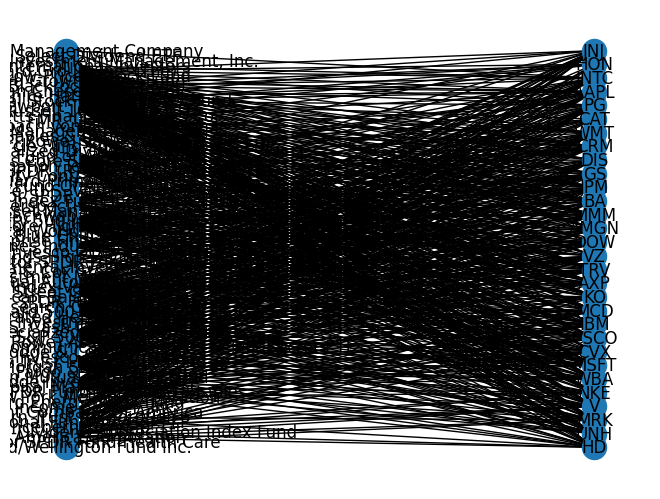

In [ ]:
# Create a bipartite layout and plot the graph
pos = nx.bipartite_layout(G, holders)
nx.draw(G, pos=pos, with_labels=True)

#####Podaci o grafu

In [ ]:
# check the size of the graph
print('No. of nodes: ', G.order())
print('No. of edges: ', G.size())

# How many edges are present in the network as compared to the total possible number of edges
density = nx.density(G)
print('The edge density is: ' + str(density))

No. of nodes:  110
No. of edges:  590
The edge density is: 0.09841534612176814


In [ ]:
# calculate clustering coefficient
clustering_coefficient = nx.average_clustering(G)
print('The clustering coefficient is: ' + str(clustering_coefficient))





The clustering coefficient is: 0.0


In [ ]:
# Print tablicu nodes-a
print("Node list:", list(G.nodes))

Node list: ['Vanguard Total Stock Market Index Fund', 'MMM', 'Vanguard 500 Index Fund', 'Schwab Strategic Tr-Schwab U.S. Dividend Equity ETF', 'Fidelity 500 Index Fund', 'SPDR S&P 500 ETF Trust', 'SPDR Dow Jones Industrial Average ETF', 'iShares Core S&P 500 ETF', 'Vanguard Index-Value Index Fund', 'Vanguard Institutional Index Fund-Institutional Index Fund', 'SPDR (R) Ser Tr- SPDR (R) S&P (R) Dividend ETF', 'AXP', 'Vanguard Specialized-Dividend Growth Fund', 'MFS Series Trust I-MFS Value Fund', 'Select Sector SPDR Fund-Financial', 'AMGN', 'Vanguard/Primecap Fund', 'Invesco ETF Tr-Invesco QQQ Tr, Series 1 ETF', 'Capital Income Builder, Inc.', 'AAPL', 'Vanguard Growth Index Fund', 'Vanguard Information Technology Index Fund', 'Select Sector SPDR Fund-Technology', 'BA', 'Growth Fund Of America Inc', 'Investment Company Of America', 'Washington Mutual Investors Fund', 'CVX', 'Select Sector SPDR Fund-Energy Select', 'Vanguard Energy Index Fund', 'Vanguard Whitehall Funds-High Dividend Yiel

Subgraph sa 50 najpovezanijih nodeova

In [ ]:
top_nodes = sorted(G.degree(), key=lambda x: x[1], reverse=True)[:50]
top_node_ids = [node[0] for node in top_nodes1]

In [ ]:
subgraph = G.subgraph(top_node_ids)

In [ ]:
# 20 najpovezanijih nodeova
top_nodes1 = sorted(G.degree(), key=lambda x: x[1], reverse=True)[:20]
top_node_ids1 = [node[0] for node in top_nodes1]

In [ ]:
subgraph1 = G.subgraph(top_node_ids1)

In [ ]:
top_nodes2 = sorted(G.degree(), key=lambda x: x[1], reverse=True)[:10]
top_node_ids2 = [node[0] for node in top_nodes2]

In [ ]:
subgraph2 = G.subgraph(top_node_ids2)

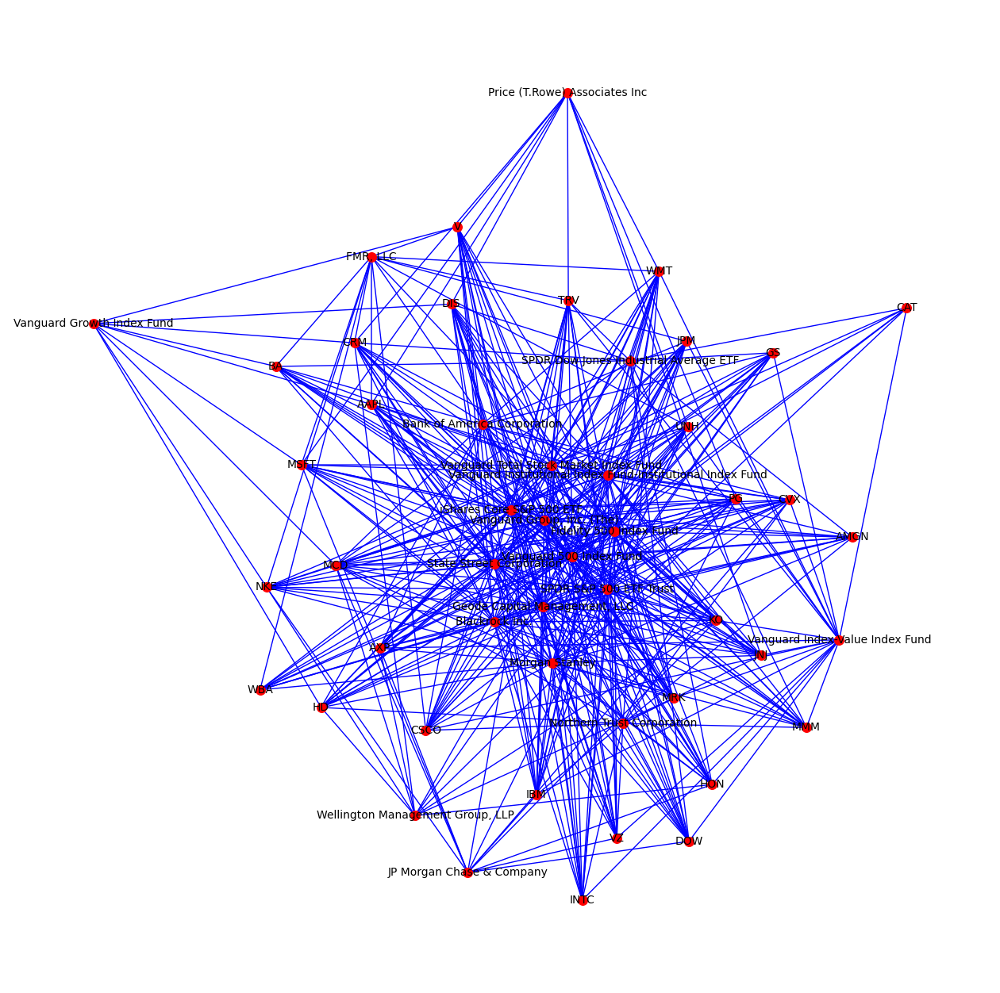

In [ ]:
# Crtamo subgraph
plt.figure(figsize=(16, 16))
pos = nx.spring_layout(subgraph, seed=42)
nx.draw_networkx_nodes(subgraph, pos, node_color='red', node_size=70)
nx.draw_networkx_edges(subgraph, pos, edge_color='blue')
nx.draw_networkx_labels(subgraph, pos, font_size=10, font_color='black', font_family='sans-serif', font_weight='normal')
plt.axis('off')
plt.show()

Za još bolju preglednost možemo prikazati 20 najpovezanijih node-ova

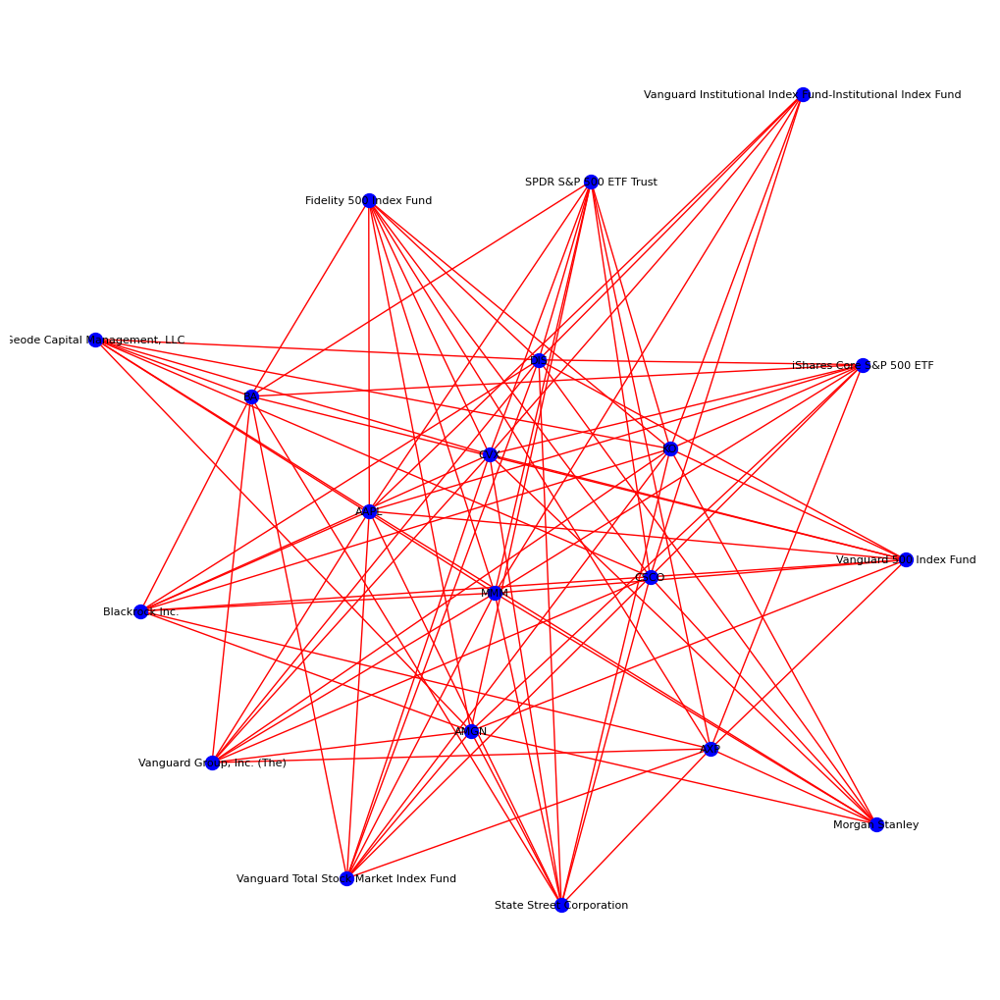

In [ ]:
degree_centrality = nx.degree_centrality(G)
# Get the 20 nodes with highest degree centrality
degree_sorted = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:20]
important_nodes = [node[0] for node in degree_sorted]

# Create a subgraph with only the important nodes
subgraph = G.subgraph(important_nodes)

# Draw the subgraph
plt.figure(figsize=(10, 10))
pos = nx.spring_layout(subgraph)
nx.draw(subgraph, pos, with_labels=True, font_size=8, node_color='blue', edge_color='red', node_size= 100, width=1)
plt.show()

##### Degree Centrality

In [ ]:
degree_centrality=nx.degree_centrality(G)
print(degree_centrality)

{'Vanguard Total Stock Market Index Fund': 0.27522935779816515, 'MMM': 0.1834862385321101, 'Vanguard 500 Index Fund': 0.27522935779816515, 'Schwab Strategic Tr-Schwab U.S. Dividend Equity ETF': 0.06422018348623854, 'Fidelity 500 Index Fund': 0.27522935779816515, 'SPDR S&P 500 ETF Trust': 0.27522935779816515, 'SPDR Dow Jones Industrial Average ETF': 0.12844036697247707, 'iShares Core S&P 500 ETF': 0.27522935779816515, 'Vanguard Index-Value Index Fund': 0.1743119266055046, 'Vanguard Institutional Index Fund-Institutional Index Fund': 0.1926605504587156, 'SPDR (R) Ser Tr- SPDR (R) S&P (R) Dividend ETF': 0.01834862385321101, 'AXP': 0.1834862385321101, 'Vanguard Specialized-Dividend Growth Fund': 0.03669724770642202, 'MFS Series Trust I-MFS Value Fund': 0.03669724770642202, 'Select Sector SPDR Fund-Financial': 0.027522935779816515, 'AMGN': 0.1834862385321101, 'Vanguard/Primecap Fund': 0.01834862385321101, 'Invesco ETF Tr-Invesco QQQ Tr, Series 1 ETF': 0.06422018348623854, 'Capital Income Bu

In [ ]:
max_node = max(degree_centrality, key=degree_centrality.get)
print("Node with highest degree centrality:", max_node)
print("Degree centrality value:", degree_centrality[max_node])

Node with highest degree centrality: Vanguard Total Stock Market Index Fund
Degree centrality value: 0.27522935779816515


In [ ]:
MF = nx.degree_centrality(G)

counter = 0
for w in sorted(MF, key = MF.get , reverse = True):
    counter = counter + 1
    if counter == 10:
        break
    print(w,'{:0.2f}'.format(MF[w]))

Vanguard Total Stock Market Index Fund 0.28
Vanguard 500 Index Fund 0.28
Fidelity 500 Index Fund 0.28
SPDR S&P 500 ETF Trust 0.28
iShares Core S&P 500 ETF 0.28
Vanguard Group, Inc. (The) 0.27
Blackrock Inc. 0.27
State Street Corporation 0.27
Geode Capital Management, LLC 0.26


Definirano je prvih 9 čvorova koji su najviše povezani s drugim čvorovima u mreži. Tako je Vanguard Total Stock Market Index, u  mreži, čvor s najvišim stupnjem centralnosti i tako predstavlja 'Holder-a' koja ima mnogo veza s drugim čvorovima i s tim veliki utjecaj u mreži.

#####Closeness centrality


In [ ]:
closeness_centrality=nx.closeness_centrality(G)
print(closeness_centrality)

{'Vanguard Total Stock Market Index Fund': 0.5797872340425532, 'MMM': 0.42248062015503873, 'Vanguard 500 Index Fund': 0.5797872340425532, 'Schwab Strategic Tr-Schwab U.S. Dividend Equity ETF': 0.35161290322580646, 'Fidelity 500 Index Fund': 0.5797872340425532, 'SPDR S&P 500 ETF Trust': 0.5797872340425532, 'SPDR Dow Jones Industrial Average ETF': 0.42913385826771655, 'iShares Core S&P 500 ETF': 0.5797872340425532, 'Vanguard Index-Value Index Fund': 0.45416666666666666, 'Vanguard Institutional Index Fund-Institutional Index Fund': 0.4658119658119658, 'SPDR (R) Ser Tr- SPDR (R) S&P (R) Dividend ETF': 0.315028901734104, 'AXP': 0.42248062015503873, 'Vanguard Specialized-Dividend Growth Fund': 0.3263473053892216, 'MFS Series Trust I-MFS Value Fund': 0.3263473053892216, 'Select Sector SPDR Fund-Financial': 0.3168604651162791, 'AMGN': 0.42248062015503873, 'Vanguard/Primecap Fund': 0.307909604519774, 'Invesco ETF Tr-Invesco QQQ Tr, Series 1 ETF': 0.36577181208053694, 'Capital Income Builder, In

In [ ]:
max_node = max(closeness_centrality, key=closeness_centrality.get)
print("Node with highest closeness centrality:", max_node)
print("Degree centrality value:", closeness_centrality[max_node])

Node with highest closeness centrality: Vanguard Total Stock Market Index Fund
Degree centrality value: 0.5797872340425532


In [ ]:
# Closeness Centrality
CC = nx.closeness_centrality(G)
counter = 0
for w in sorted(CC, key =CC.get,  reverse = True):
    counter = counter + 1
    if counter == 10:
        break
    print(w,"{:0.4f}".format(CC[w]))

Vanguard Total Stock Market Index Fund 0.5798
Vanguard 500 Index Fund 0.5798
Fidelity 500 Index Fund 0.5798
SPDR S&P 500 ETF Trust 0.5798
iShares Core S&P 500 ETF 0.5798
Vanguard Group, Inc. (The) 0.5677
Blackrock Inc. 0.5677
State Street Corporation 0.5677
Geode Capital Management, LLC 0.5619


Vanguard Total Stock Market Index Fund  je 'Holder' koji je najbliži ostalim holderima, a time je važniji.

#####Betweenness centrality


In [ ]:
# Izračun centralnosti izmeđušnosti (betweenness centrality) čvorova
betweenness_dict = nx.betweenness_centrality(G)

# Sortiranje čvorova prema centralnosti izmeđušnosti
sorted_nodes = sorted(betweenness_dict, key=betweenness_dict.get, reverse=True)

# Prikaz top N čvorova s najvišom centralnošću izmeđušnosti
top_n = 5  # Broj najvažnijih čvorova koje želite prikazati
print(f"Top {top_n} holders by betweenness centrality:")
for node in sorted_nodes[:top_n]:
    print(f"{node}: {betweenness_dict[node]}")


Top 5 holders by betweenness centrality:
WBA: 0.09637232026500238
TRV: 0.0656465244681611
DOW: 0.06465776486322483
Vanguard Total Stock Market Index Fund: 0.05746232380139144
Vanguard 500 Index Fund: 0.05746232380139144


In [ ]:
betweenness_centrality=nx.betweenness_centrality(G)
print(betweenness_centrality)

{'Vanguard Total Stock Market Index Fund': 0.05746232380139144, 'MMM': 0.04453332399341477, 'Vanguard 500 Index Fund': 0.05746232380139144, 'Schwab Strategic Tr-Schwab U.S. Dividend Equity ETF': 0.002022609845552185, 'Fidelity 500 Index Fund': 0.05746232380139144, 'SPDR S&P 500 ETF Trust': 0.05746232380139144, 'SPDR Dow Jones Industrial Average ETF': 0.013372934842541626, 'iShares Core S&P 500 ETF': 0.05746232380139144, 'Vanguard Index-Value Index Fund': 0.019898977231858836, 'Vanguard Institutional Index Fund-Institutional Index Fund': 0.019739889079668876, 'SPDR (R) Ser Tr- SPDR (R) S&P (R) Dividend ETF': 0.0002901824545893539, 'AXP': 0.028815476317579834, 'Vanguard Specialized-Dividend Growth Fund': 0.0003776589170149705, 'MFS Series Trust I-MFS Value Fund': 0.0005130754491387541, 'Select Sector SPDR Fund-Financial': 0.00020908843168027344, 'AMGN': 0.05594180281871317, 'Vanguard/Primecap Fund': 6.794827950216465e-05, 'Invesco ETF Tr-Invesco QQQ Tr, Series 1 ETF': 0.00281373624290767

In [ ]:
max_node = max(betweenness_centrality, key=betweenness_centrality.get)
print("Node with highest betweenness centrality:", max_node)
print("Degree centrality value:", betweenness_centrality[max_node])

Node with highest betweenness centrality: WBA
Degree centrality value: 0.09637232026500238


In [ ]:
# Betweeness Centrality
BC = nx.betweenness_centrality(G)
counter = 0
for w in sorted(BC, key =BC.get,  reverse = True):
    counter = counter + 1
    if counter == 10:
        break
    print(w,"{:0.4f}".format(BC[w]))

WBA 0.0964
TRV 0.0656
DOW 0.0647
Vanguard Total Stock Market Index Fund 0.0575
Vanguard 500 Index Fund 0.0575
Fidelity 500 Index Fund 0.0575
SPDR S&P 500 ETF Trust 0.0575
iShares Core S&P 500 ETF 0.0575
BA 0.0574


In [ ]:
WBA je čvor koji utječe na međusoban odnos i povezanost nodeova u mreži.

####Centrality Graphs

In [ ]:
# Calculate centrality measures
degree_centrality = nx.degree_centrality(subgraph)
closeness_centrality = nx.closeness_centrality(subgraph)
betweenness_centrality = nx.betweenness_centrality(subgraph)
eigenvector_centrality = nx.eigenvector_centrality(subgraph)

# Create dataframe
df = pd.DataFrame({'degree_centrality': degree_centrality,
                   'closeness_centrality': closeness_centrality,
                   'betweenness_centrality': betweenness_centrality,
                   'eigenvector_centrality': eigenvector_centrality})

print(df.head())

                                                    degree_centrality  \
Fidelity 500 Index Fund                                      0.473684   
Vanguard Institutional Index Fund-Institutional...           0.315789   
iShares Core S&P 500 ETF                                     0.473684   
CVX                                                          0.578947   
CSCO                                                         0.578947   

                                                    closeness_centrality  \
Fidelity 500 Index Fund                                         0.655172   
Vanguard Institutional Index Fund-Institutional...              0.542857   
iShares Core S&P 500 ETF                                        0.655172   
CVX                                                             0.703704   
CSCO                                                            0.703704   

                                                    betweenness_centrality  \
Fidelity 500 Index Fund   

In [ ]:
# Top 10 nodes based on degree centrality
top_10_nodes_DC = df.sort_values('degree_centrality', ascending=False).head(10).index.tolist()
print("Top 10 nodes based on degree centrality:", top_10_nodes_DC) #These nodes may be considered as highly connected nodes in the network.

# Top 10 nodes based on closeness centrality
top_10_nodes_CC = df.sort_values('closeness_centrality', ascending=False).head(10).index.tolist()
print("Top 10 nodes based on closeness centrality:", top_10_nodes_CC) #These nodes may be considered as central nodes in the network.

# Top 10 nodes based on betweenness centrality
top_10_nodes_BC = df.sort_values('betweenness_centrality', ascending=False).head(10).index.tolist()
print("Top 10 nodes based on betweenness centrality:", top_10_nodes_BC) #These nodes may be considered as important nodes for the flow of information in the network.

# Top 10 nodes based on eigenvector centrality
top_10_nodes_EC = df.sort_values('eigenvector_centrality', ascending=False).head(10).index.tolist()
print("Top 10 nodes based on eigenvector centrality:", top_10_nodes_EC) # These nodes may be considered as influential nodes in the network.

Top 10 nodes based on degree centrality: ['AAPL', 'CVX', 'CSCO', 'DIS', 'KO', 'MMM', 'AMGN', 'Blackrock Inc.', 'Vanguard Group, Inc. (The)', 'State Street Corporation']
Top 10 nodes based on closeness centrality: ['AAPL', 'CVX', 'CSCO', 'DIS', 'KO', 'MMM', 'SPDR S&P 500 ETF Trust', 'Vanguard Group, Inc. (The)', 'State Street Corporation', 'Vanguard 500 Index Fund']
Top 10 nodes based on betweenness centrality: ['AAPL', 'CVX', 'CSCO', 'DIS', 'KO', 'MMM', 'AMGN', 'AXP', 'BA', 'Vanguard 500 Index Fund']
Top 10 nodes based on eigenvector centrality: ['AAPL', 'CVX', 'CSCO', 'DIS', 'KO', 'MMM', 'AMGN', 'Blackrock Inc.', 'Vanguard Group, Inc. (The)', 'State Street Corporation']


In [ ]:
# identify important nodes
top_degree_centrality = sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:5]
top_betweenness_centrality = sorted(betweenness_centrality, key=betweenness_centrality.get, reverse=True)[:5]
top_eigenvector_centrality = sorted(eigenvector_centrality, key=eigenvector_centrality.get, reverse=True)[:5]
print('Top degree centrality nodes: ' + str(top_degree_centrality))
print('Top betweenness centrality nodes: ' + str(top_betweenness_centrality))
print('Top eigenvector centrality nodes: ' + str(top_eigenvector_centrality))

Top degree centrality nodes: ['CVX', 'CSCO', 'KO', 'MMM', 'DIS']
Top betweenness centrality nodes: ['CVX', 'CSCO', 'KO', 'MMM', 'DIS']
Top eigenvector centrality nodes: ['CVX', 'CSCO', 'KO', 'MMM', 'DIS']


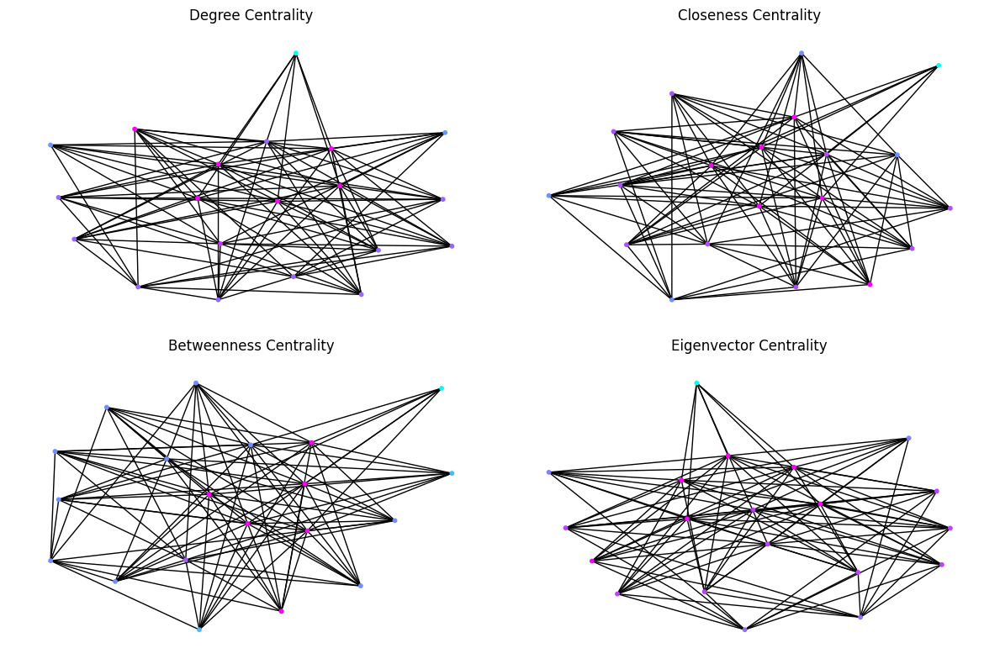

In [ ]:
# Get the 50 nodes with highest degree centrality
degree_sorted = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:50]
important_nodes = [node[0] for node in degree_sorted]

# Create a subgraph with only the important nodes
subgraph = G.subgraph(important_nodes)

# Draw the subgraph
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
axs = axs.flatten()

nx.draw(subgraph, ax=axs[0], with_labels=False, node_size=10, node_color=list(degree_centrality.values()), cmap='cool')
axs[0].set_title('Degree Centrality')

nx.draw(subgraph, ax=axs[1], with_labels=False, node_size=10, node_color=list(closeness_centrality.values()), cmap='cool')
axs[1].set_title('Closeness Centrality')

nx.draw(subgraph, ax=axs[2], with_labels=False, node_size=10, node_color=list(betweenness_centrality.values()), cmap='cool')
axs[2].set_title('Betweenness Centrality')

nx.draw(subgraph, ax=axs[3], with_labels=False, node_size=10, node_color=list(eigenvector_centrality.values()), cmap='cool')
axs[3].set_title('Eigenvector Centrality')

plt.tight_layout()
plt.show()

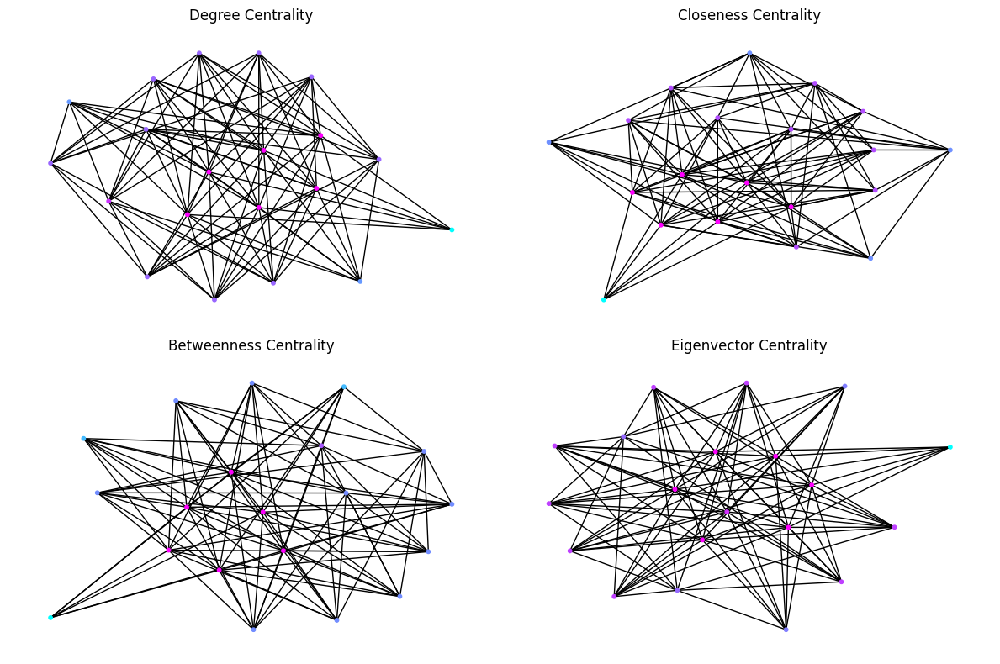

In [ ]:
# Get the 20 nodes with highest degree centrality
degree_sorted = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:20]
important_nodes = [node[0] for node in degree_sorted]

# Create a subgraph with only the important nodes
subgraph = G.subgraph(important_nodes)

# Compute centralities for the subgraph
subgraph_degree_centrality = nx.degree_centrality(subgraph)
subgraph_closeness_centrality = nx.closeness_centrality(subgraph)
subgraph_betweenness_centrality = nx.betweenness_centrality(subgraph)
subgraph_eigenvector_centrality = nx.eigenvector_centrality(subgraph)

# Draw the subgraph
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
axs = axs.flatten()

nx.draw(subgraph, ax=axs[0], with_labels=False, node_size=10, node_color=list(subgraph_degree_centrality.values()), cmap='cool')
axs[0].set_title('Degree Centrality')

nx.draw(subgraph, ax=axs[1], with_labels=False, node_size=10, node_color=list(subgraph_closeness_centrality.values()), cmap='cool')
axs[1].set_title('Closeness Centrality')

nx.draw(subgraph, ax=axs[2], with_labels=False, node_size=10, node_color=list(subgraph_betweenness_centrality.values()), cmap='cool')
axs[2].set_title('Betweenness Centrality')

nx.draw(subgraph, ax=axs[3], with_labels=False, node_size=10, node_color=list(subgraph_eigenvector_centrality.values()), cmap='cool')
axs[3].set_title('Eigenvector Centrality')

plt.tight_layout()
plt.show()

In [ ]:
# Spajamo rezultate u DataFrame
centralities_df = pd.DataFrame({'degree': degree_centrality,
                                'closeness': closeness_centrality,
                                'betweenness': betweenness_centrality,
                                'eigenvector': eigenvector_centrality})

In [ ]:
# Sortirati po stupcima za svaku centralnost
centralities_df = centralities_df.sort_values(by=['degree', 'closeness', 'betweenness', 'eigenvector'], ascending=False)

In [ ]:
# Top 100 cvorova po svakoj centralnosti
centralities_df = centralities_df.head(100)

In [ ]:
# Ispiši DataFrame
print(centralities_df)

                                                      degree  closeness  \
CVX                                                 0.578947   0.703704   
CSCO                                                0.578947   0.703704   
KO                                                  0.578947   0.703704   
MMM                                                 0.578947   0.703704   
DIS                                                 0.578947   0.703704   
AAPL                                                0.578947   0.703704   
AMGN                                                0.526316   0.655172   
Fidelity 500 Index Fund                             0.473684   0.655172   
iShares Core S&P 500 ETF                            0.473684   0.655172   
Vanguard Total Stock Market Index Fund              0.473684   0.655172   
SPDR S&P 500 ETF Trust                              0.473684   0.655172   
Blackrock Inc.                                      0.473684   0.655172   
Vanguard 500 Index Fund  

####community

In [ ]:
pip install python-louvain


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import networkx as nx
from networkx.algorithms import community

# Perform community detection using the Girvan-Newman algorithm
communities_generator = community.girvan_newman(G)
top_level_communities = next(communities_generator)

# Sort communities based on their size
sorted_communities = sorted(top_level_communities, key=len, reverse=True)

# Select the top 50 communities
top_communities = sorted_communities[:50]

# Analyze the top communities
for i, community in enumerate(top_communities):
    print('Community ' + str(i+1) + ': ' + str(community))


Community 1: {'AXP', 'Vanguard Whitehall Funds-High Dividend Yield Index Fund', 'Vanguard Specialized-Health Care Fund', 'MMM', 'PG', 'JPM', 'Massachusetts Financial Services Co.', 'Vanguard Specialized-Dividend Growth Fund', 'MCD', 'WBA', 'Bank Of New York Mellon Corporation', 'INTC', 'Vanguard Energy Index Fund', 'SPDR (R) Idx Shares-SPDR Communication Services Select Sector ETF', 'Fidelity Low-Priced Stock Fund', 'Fidelity Contrafund Inc', 'Fidelity 500 Index Fund', 'Berkshire Hathaway, Inc', 'Newport Trust Co', 'CRM', 'Price (T.Rowe) Blue Chip Growth Fund Inc.', 'Vanguard Information Technology Index Fund', 'Blackrock Inc.', 'Geode Capital Management, LLC', 'Invesco ETF Tr-Invesco QQQ Tr, Series 1 ETF', 'ClearBridge Investments, LLC', 'TRV', 'Dodge & Cox Inc', 'UNH', 'JP Morgan Chase & Company', 'Vanguard/Wellington Fund Inc.', 'KO', 'DOW', 'Capital International Investors', 'BA', 'Washington Mutual Investors Fund', 'SPDR (R) Ser Tr- SPDR (R) S&P (R) Dividend ETF', 'Northern Trust 

#### ECDF

In [ ]:
# Arrays centralnosti
degree_array = np.array(list(degree_centrality.values()))
closeness_array = np.array(list(closeness_centrality.values()))
betweenness_array = np.array(list(betweenness_centrality.values()))
eigenvector_array = np.array(list(eigenvector_centrality.values()))

In [ ]:
# Ascending order
degree_sorted = np.sort(degree_array)
closeness_sorted = np.sort(closeness_array)
betweenness_sorted = np.sort(betweenness_array)
eigenvector_sorted = np.sort(eigenvector_array)

In [ ]:
# Racunanje ECDFsa
degree_ecdf = sm.distributions.ECDF(degree_sorted)
closeness_ecdf = sm.distributions.ECDF(closeness_sorted)
betweenness_ecdf = sm.distributions.ECDF(betweenness_sorted)
eigenvector_ecdf = sm.distributions.ECDF(eigenvector_sorted)

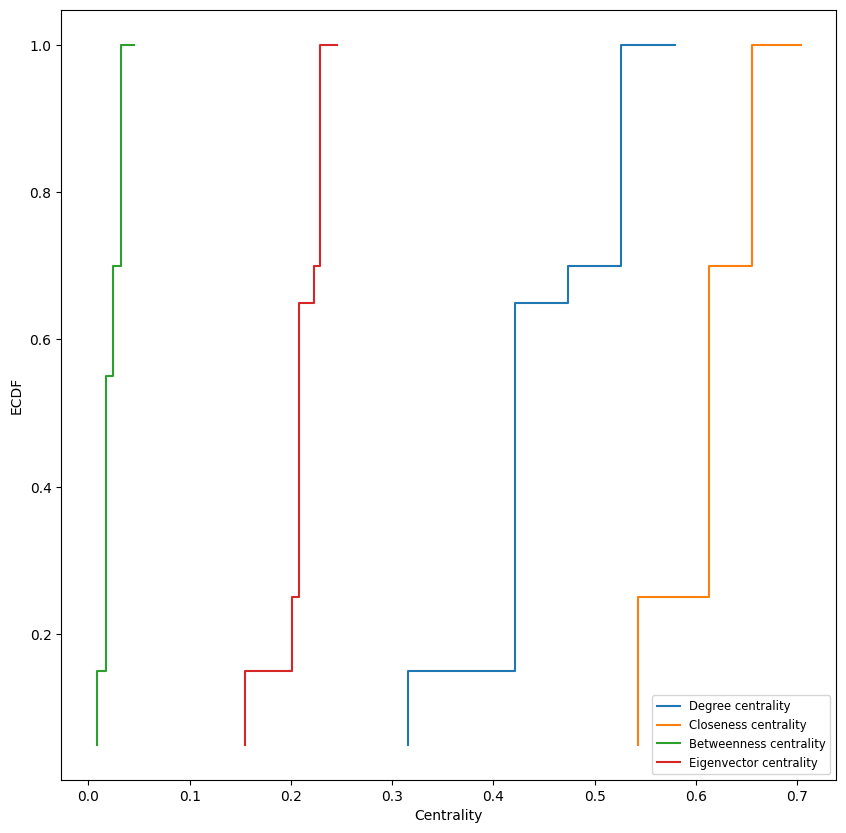

In [ ]:
# Plot ECDFs
plt.figure(figsize=(10, 10))
plt.xlabel('Centrality')
plt.ylabel('ECDF')
plt.step(degree_sorted, degree_ecdf(degree_sorted), label='Degree centrality')
plt.step(closeness_sorted, closeness_ecdf(closeness_sorted), label='Closeness centrality')
plt.step(betweenness_sorted, betweenness_ecdf(betweenness_sorted), label='Betweenness centrality')
plt.step(eigenvector_sorted, eigenvector_ecdf(eigenvector_sorted), label='Eigenvector centrality')
plt.legend(loc='lower right', fontsize='small')
plt.show()

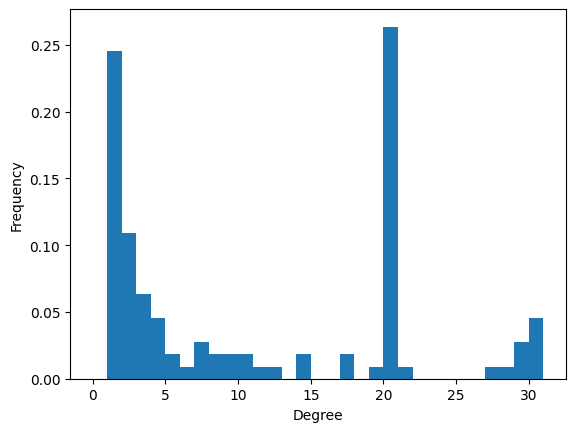

In [ ]:
# Plot the degree distribution
degree_sequence = sorted([d for n, d in G.degree()], reverse=True)

plt.hist(degree_sequence, bins=range(max(degree_sequence)+2), density=True)
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.show()

In [ ]:
# Generate a Barabasi-Albert model network
G = nx.barabasi_albert_graph(200, 2)

In [ ]:
# Calculate and print basic measures of the graph
print("Number of nodes:", G.number_of_nodes())
print("Number of edges:", G.number_of_edges())
print("Density of the graph:", nx.density(G))

Number of nodes: 200
Number of edges: 396
Density of the graph: 0.019899497487437186


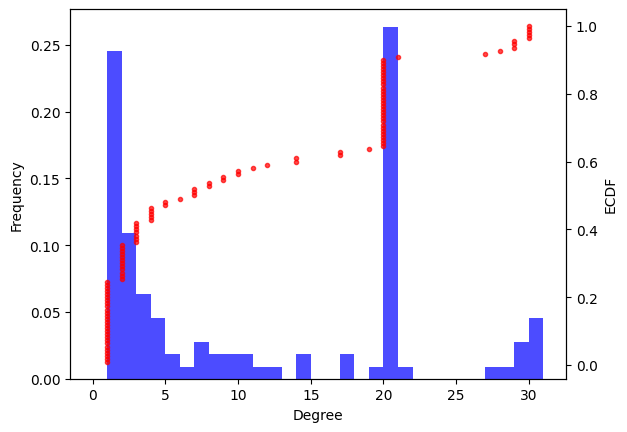

In [ ]:
# Compute the ECDF
x = np.sort(degree_sequence)
y = np.arange(1, len(x)+1) / len(x)

# Plot the histogram and ECDF
fig, ax1 = plt.subplots()
ax1.hist(degree_sequence, bins=range(max(degree_sequence)+2), density=True, color='blue', alpha=0.7)
ax1.set_xlabel('Degree')
ax1.set_ylabel('Frequency')
ax2 = ax1.twinx()
ax2.plot(x, y, marker='.', linestyle='none', color='red', alpha=0.7)
ax2.set_ylabel('ECDF')
plt.show()

#### Conclusion

Na temelju navedenih podataka o centralnostima i zajednicama, može se zaključiti sljedeće:

Degree centrality (centralnost stupnja): Vanguard Total Stock Market Index Fund, Vanguard 500 Index Fund, Fidelity 500 Index Fund, SPDR S&P 500 ETF Trust i iShares Core S&P 500 ETF imaju istu vrijednost stupnja centralnosti od 0.28. Ovo sugerira da su ovi fondovi vrlo povezani s drugim čvorovima u mreži i da imaju značajan utjecaj.

Closeness centrality (centralnost blizine): Vanguard Total Stock Market Index Fund, Vanguard 500 Index Fund, Fidelity 500 Index Fund, SPDR S&P 500 ETF Trust i iShares Core S&P 500 ETF također imaju sličnu vrijednost centralnosti blizine od približno 0.58. Ovo ukazuje na to da su ovi fondovi vrlo blizu ostalim čvorovima u mreži i da imaju dobar pristup informacijama i resursima.

Betweenness centrality (centralnost između): Prema vrijednostima između centrality, WBA (Walgreens Boots Alliance), TRV (Travelers Companies) i DOW (Dow Chemical Company) imaju najveću između centralnost, što znači da ovi čvorovi igraju ključnu ulogu u održavanju komunikacije i protoka informacija unutar mreže.

S obzirom na ove zaključke, preporuke za ulaganje mogu uključivati sljedeće:

Razmotrite ulaganje u fondove s visokom centralnošću stupnja i blizine, poput Vanguard Total Stock Market Index Fund, Vanguard 500 Index Fund, Fidelity 500 Index Fund, SPDR S&P 500 ETF Trust i iShares Core S&P 500 ETF. Ovi fondovi su dobro povezani i imaju pristup širokom spektru dionica na tržištu.

Također, vrijedi istražiti fondove ili tvrtke s visokom između centralnošću poput WBA, TRV i DOW. Oni mogu biti ključni igrači u industriji i mogu pružiti dodatne mogućnosti za diversifikaciju portfelja.

Važno je napomenuti da ovo su samo preporuke na temelju analize centralnosti u mreži i trebate obaviti dodatno istraživanje prije donošenja bilo kakvih ulagačkih odluka. Također, uvijek se posavjetujte s financijskim stručnjakom ili savjetnikom prije donošenja važnih ulagačkih odluka.